<a href="https://colab.research.google.com/github/applejxd/colaboratory/blob/master/simulation/HyperbolicPDE.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## 双曲型: 波動方程式

波動方程式
\begin{equation}
    \frac{∂^2u}{∂t^2}=c^2\frac{∂^2u}{∂x^2}
\end{equation}
を解く。条件は
- $c=1$
- $x\in[0,1]$,
- $t\in[0,0.4]$,
- $u(0,t)=u(1,t)=0$ (境界条件).

ただし数値不安定性を避けるために、
時間方向の刻み幅$k$は空間方向の刻み幅$h$に対して
\begin{equation}
    k\leq\frac{h}{c}
\end{equation}
を満たすように選ぶ (CFL 条件)。

In [1]:
import numpy as np

speed = 1

x_diff = 0.01
x_list = np.arange(0, 1, x_diff)
N = len(x_list)

t_diff = x_diff / speed
t_list = np.arange(0, 0.4, t_diff)

### 初期条件

初期条件は
\begin{equation}
    u(x,0)=
    \begin{cases}
        &\dfrac{1}{2}\cos(8\pi(x-1/2))+\dfrac{1}{2}\quad(3/8\leq x\leq5/8), \\
        &0\quad(\text{otherwise}),
    \end{cases}
\end{equation}
および
\begin{equation}
    \frac{∂u}{∂t}(x,0)=0
\end{equation}
とする.

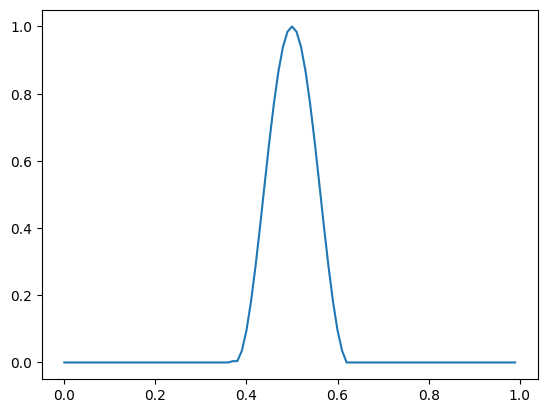

In [2]:
import matplotlib.pyplot as plt

u_start = 0.5 * np.cos(8 * np.pi * (x_list - 0.5)) + 0.5
# otherwise
u_start[0:int(3/8/x_diff)] = u_start[int(5/8/x_diff):] = 0

plt.plot(x_list, u_start)
plt.show()

### 係数行列

数値積分は連立1次方程式の形
\begin{align}
    &\frac{∂u}{∂t}(x,t)≡v(x,t), \\
    &\frac{∂v}{∂t}=c^2\frac{∂^2u}{∂x^2}
\end{align}
で解く.係数行列は
\begin{equation}
    \begin{pmatrix}
        ∂_tu \\ ∂_tv
    \end{pmatrix}
    =
    \begin{pmatrix}
        O & I \\ c^2∂_x^2 & O
    \end{pmatrix}
    \begin{pmatrix}
        u \\ v
    \end{pmatrix}
\end{equation}
の差分化である。


In [3]:
import scipy.sparse as sparse

# _1 はひとつ前の意
u_1 = sparse.dia_array((np.ones(N), [-1]), shape=(N, N))

# 行列の端をどれくらい表示するか
np.set_printoptions(edgeitems=3)
# 桁数をどうするか
np.set_printoptions(precision=3)

u_1.toarray()

array([[0., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 1., 0., 0.],
       [0., 0., 0., ..., 0., 1., 0.]])

In [4]:
# 1 はひとつ後の意
u1 = sparse.dia_array((np.ones(N), [1]), shape=(N, N))
u1.toarray()

array([[0., 1., 0., ..., 0., 0., 0.],
       [0., 0., 1., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 1., 0.],
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [5]:
id_mat = sparse.identity(N)

diff_mat = (u1 -2 * id_mat + u_1) / (x_diff ** 2)
diff_mat.toarray()

array([[-20000.,  10000.,      0., ...,      0.,      0.,      0.],
       [ 10000., -20000.,  10000., ...,      0.,      0.,      0.],
       [     0.,  10000., -20000., ...,      0.,      0.,      0.],
       ...,
       [     0.,      0.,      0., ..., -20000.,  10000.,      0.],
       [     0.,      0.,      0., ...,  10000., -20000.,  10000.],
       [     0.,      0.,      0., ...,      0.,  10000., -20000.]])

In [6]:
zero_mat = sparse.csr_matrix((N, N))

coeff_mat = sparse.bmat([[zero_mat, id_mat], [diff_mat, zero_mat]])
coeff_mat.toarray()

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

### 積分

In [7]:
from scipy.integrate import solve_ivp

def diff_operator(t, u_list):
    return coeff_mat * u_list

u_sol = solve_ivp(diff_operator, t_span=(0, 0.4),
                  y0=np.hstack([u_start, np.zeros(len(x_list))]),
                  method="RK45", dense_output=True, rtol=1e-8)
u_list = u_sol.sol(t_list).T[:, 0:len(x_list)]

### 可視化

In [8]:
%%capture
!pip install japanize-matplotlib
import matplotlib.pyplot as plt
import japanize_matplotlib
import matplotlib.animation as animation

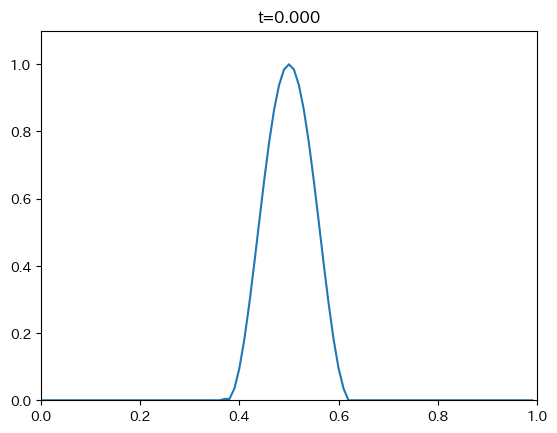

In [9]:
fig, ax = plt.subplots()

# 共通設定・初期設定
ax.set_xlim([0, 1])
ax.set_ylim([0, 1.1])
line, = ax.plot([], [])

# 更新の関数
def animate(frame):
    t = t_list[frame]
    rho = u_list[frame]
    ax.set_title(f"t={t:.3f}")
    line.set_data(x_list, rho)
    return (line)

ani = animation.FuncAnimation(fig, animate, frames=len(t_list), interval=50)
ani.save("./wave_1d.gif", writer="pillow", dpi=300)

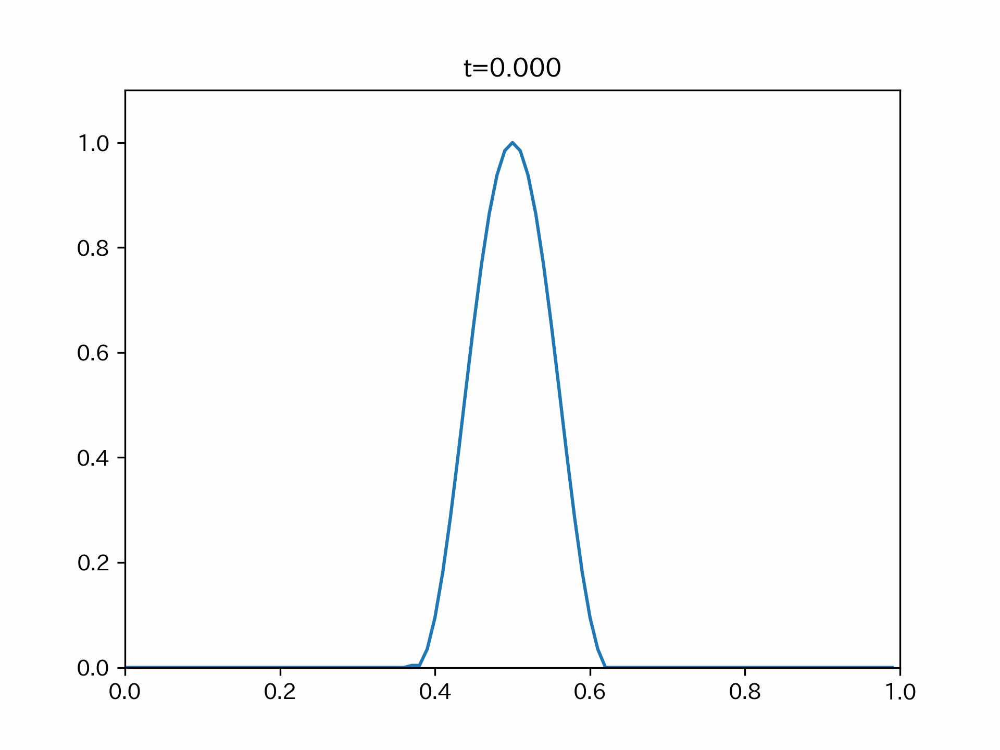

In [10]:
from IPython.display import Image

# アニメーション再生
Image("./wave_1d.gif", format='png')

## 双極型・2次元

In [11]:
speed = 1

x_diff = 0.01
x_list = np.arange(0, 1, x_diff)
y_diff = 0.01
y_list = np.arange(0, 1, x_diff)

t_diff = x_diff / speed
t_max = 3
t_list = np.arange(0, t_max, t_diff)

初期条件の設定（ソースを2個追加）

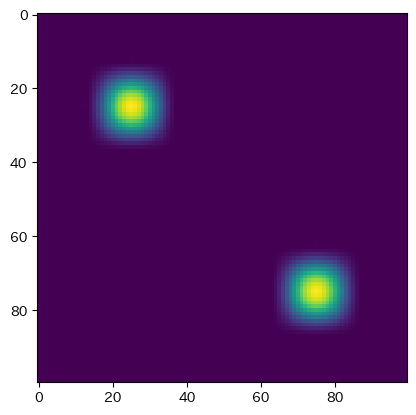

In [12]:
import matplotlib.pyplot as plt

u_start_original = 0.5 * np.cos(8 * np.pi * (x_list - 0.5)) + 0.5

# 1次元と同様に cos 関数から削って作る
first_peak = u_start_original.copy()
# 1/8 < x < 3/8
first_peak[:int(1/8/x_diff)] = first_peak[int(3/8/x_diff):] = 0
first_peak = np.tensordot(first_peak, first_peak, axes=0)

second_peak = u_start_original.copy()
# 5/8 < x < 7/8
second_peak[:int(5/8/x_diff)] = second_peak[int(7/8/x_diff):] = 0
second_peak = np.tensordot(second_peak, second_peak, axes=0)

# 初期条件
u_start = first_peak + second_peak

plt.imshow(u_start)

In [13]:
x_num, y_num = len(x_list), len(y_list)
mat_num = x_num * y_num

# 境界条件を反映させたシフト演算子
u_10 = sparse.lil_matrix(sparse.eye(mat_num, k=-1))
u_10[0::y_num, :] = 0
for idx in range(0, x_num):
    u_10[idx * y_num, idx * y_num] = 1
u_10 = sparse.csr_matrix(u_10)

u_10.toarray()

array([[1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 1., 0., 0.],
       [0., 0., 0., ..., 0., 1., 0.]])

In [14]:
u10 = sparse.lil_matrix(sparse.eye(mat_num, k=1))
u10[y_num-1::y_num, :] = 0
for idx in range(0, x_num):
    u10[(idx+1) * y_num-1, (idx+1) * y_num-1] = 1
u10 = sparse.csr_matrix(u10)

u10.toarray()

array([[0., 1., 0., ..., 0., 0., 0.],
       [0., 0., 1., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 1., 0.],
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.]])

In [15]:
u0_1 = sparse.lil_matrix(sparse.eye(mat_num, k=-y_num))
u0_1[:y_num-1, :] = 0
for idx in range(0, y_num):
    u0_1[idx, idx] = 1
u0_1 = sparse.csr_matrix(u0_1)

u0_1.toarray()

array([[1., 0., 0., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       [0., 0., 1., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [16]:
u01 = sparse.lil_matrix(sparse.eye(mat_num, k=y_num))
u01[(x_num-1) * y_num:, :] = 0
for idx in range(0, y_num):
    u01[(x_num-1) * y_num + idx, (x_num-1) * y_num + idx] = 1
u01 = sparse.csr_matrix(u01)

u01.toarray()

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 1., 0., 0.],
       [0., 0., 0., ..., 0., 1., 0.],
       [0., 0., 0., ..., 0., 0., 1.]])

In [17]:
# 微分演算子
id_mat = sparse.identity(mat_num)
diff_mat = (-4 * id_mat + u_10 + u10 + u0_1 + u01) / (x_diff ** 2)

diff_mat.toarray()

array([[-20000.,  10000.,      0., ...,      0.,      0.,      0.],
       [ 10000., -30000.,  10000., ...,      0.,      0.,      0.],
       [     0.,  10000., -30000., ...,      0.,      0.,      0.],
       ...,
       [     0.,      0.,      0., ..., -30000.,  10000.,      0.],
       [     0.,      0.,      0., ...,  10000., -30000.,  10000.],
       [     0.,      0.,      0., ...,      0.,  10000., -20000.]])

In [18]:
zero_mat = sparse.csr_matrix((mat_num, mat_num))
coeff_mat = sparse.bmat([[zero_mat, id_mat], [diff_mat, zero_mat]])

coeff_mat.toarray()

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [19]:
def diff_operator(t, u_list):
    return coeff_mat * u_list

u_sol = solve_ivp(diff_operator, t_span=(0, t_max),
                  y0=np.hstack([u_start.reshape(-1), np.zeros(mat_num)]),
                  method="RK45", dense_output=True, rtol=1e-8)
u_list = u_sol.sol(t_list).T[:, :mat_num]

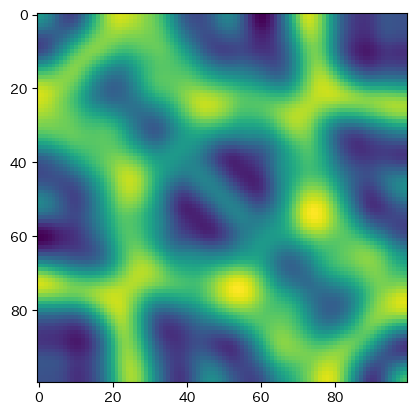

In [20]:
plt.imshow(u_list[-1].reshape(x_num, y_num))

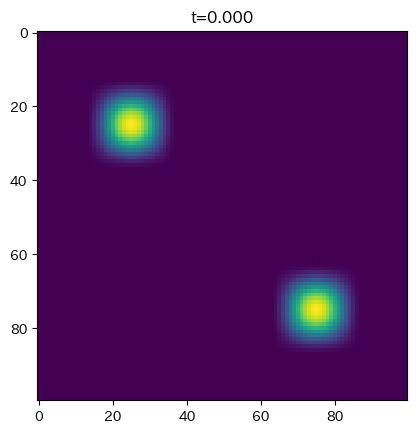

In [21]:
fig, ax = plt.subplots()

# 共通設定・初期設定
graph = ax.imshow(u_list[0].reshape(x_num, y_num))

# 更新の関数
def animate(frame):
    t = t_list[frame]
    rho = u_list[frame]
    ax.set_title(f"t={t:.3f}")
    graph.set_data(u_list[frame].reshape(x_num, y_num))
    return (line)

ani = animation.FuncAnimation(fig, animate, frames=len(t_list), interval=50)
ani.save("./wave_2d.gif", writer="pillow", dpi=300)

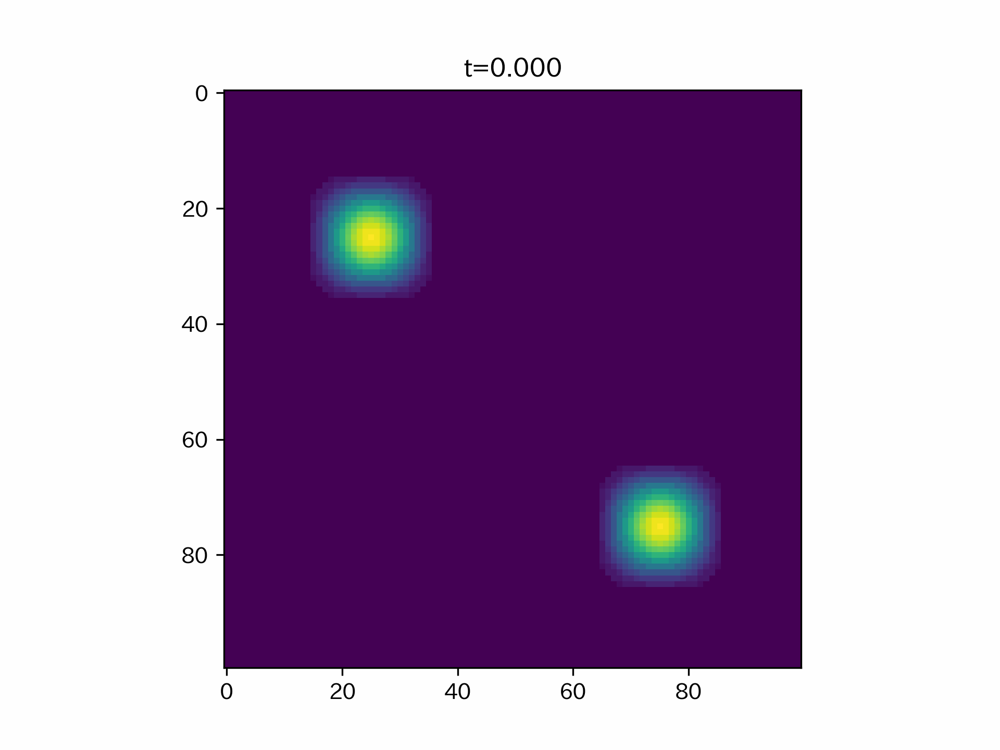

In [22]:
# アニメーション再生
Image("./wave_2d.gif", format='png')